### Imports

In [ ]:
!pip uninstall -y -r ./requirements.txt
!pip install -r ./requirements.txt

In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np

from umap import UMAP

from helper_functions.data_management import data_loading, random_sampling, joint_random_sampling
from helper_functions.plotting import color_plot, plot3d_dataset, plot_umap
from unsupervised_learning.algorithms import (MountainClustering,
                                            SubstractiveClustering,
                                            KMeans,
                                            FuzzCMeans,
                                            GaussianMixture)

### Data Loading

In [2]:
manip_category = 'wash_trade'
energy_threshold = 0.5
use_cone = False

manip_features = data_loading(manip_category, energy_threshold, use_cone)

### Visualization

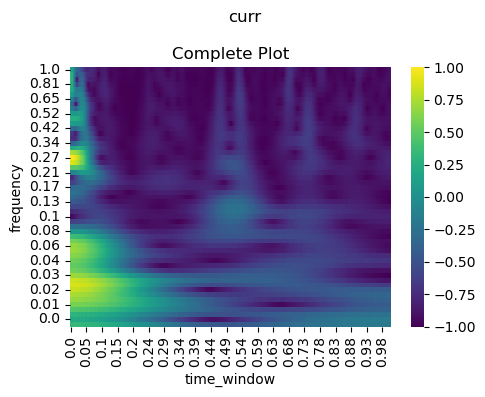

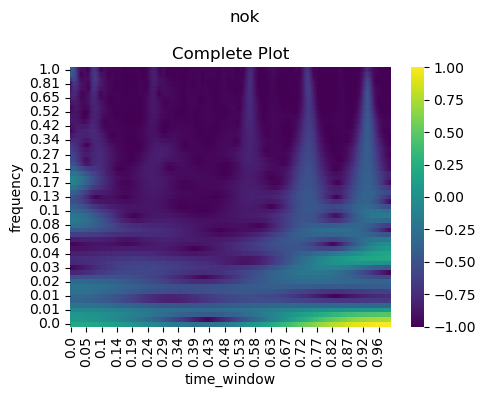

In [3]:
for stock_name, stock_dict in manip_features.items():
    color_plot(stock_dict, stock_name)

### Visualization

In [4]:
stock_name = 'curr'
plot_against = 'frequency'
hue_var = 'target'
feature_matrix = manip_features[stock_name]['features']

plot3d_dataset(feature_matrix, stock_name, plot_against, hue_var)

### Sample Characteristics

In [3]:
total_n_samples = sum(len(stock_features['features']) for stock_features in manip_features.values())
percentage_to_sample = 10000 / total_n_samples
train_x_all, train_y, _, _, _, _ = joint_random_sampling(manip_features, percentage_to_sample, .01, 'uniform', False)

train_x = train_x_all[:, :-1]

### Visualize Sampled Data

In [6]:
plot_against = 'frequency'
hue_var = 'modulus'

plot3d_dataset(np.concatenate([train_x_all, train_y.reshape(-1, 1)], axis=1),
                f'{manip_category} - Sampled Dataset',
                plot_against,
                hue_var)

In [4]:
n_neighbors = 20
min_dist = 0.35
n_components = 3
metric = 'euclidean'

umap_model = UMAP(
    n_neighbors=n_neighbors,
    min_dist=min_dist,
    n_components=n_components,
    metric=metric
)
embedding = umap_model.fit_transform(train_x_all)

plot_umap(embedding, train_x_all[:, -1], n_components, f'{manip_category} - UMAP Embedding of Sampled Dataset')

### Run Algorithms

#### Mountain Clustering

##### Raw Data

In [9]:
mountain_clustering = MountainClustering(number_of_partitions=10,
                                        distance_metric='euclidean',
                                        sigma_squared=1,
                                        beta_squared=1.5,)

mountain_clustering.fit(train_x_all)

mountain_cluster_assignments = mountain_clustering.predict()

mountain_feature_matrix = np.hstack([train_x_all, mountain_cluster_assignments])

In [10]:
plot_against = 'frequency'

plot3d_dataset(mountain_feature_matrix,
            f'{manip_category} - Raw Data - Mountain Clustering',
            plot_against,
            'target')

In [11]:
np.unique(mountain_cluster_assignments, return_counts=True)

(array([0., 1., 2., 3., 4.]),
 array([6849, 2736,  267,   22,  184], dtype=int64))

In [12]:
plot_umap(embedding,
        mountain_cluster_assignments.squeeze(),
        n_components,
        'Mountain Clustering - UMAP Embedding structure of identified clusters')

##### UMAP Embedding

In [14]:
umap_mountain_clustering = MountainClustering(number_of_partitions=10,
                                        distance_metric='euclidean',
                                        sigma_squared=1,
                                        beta_squared=1.5,)
umap_mountain_clustering.fit(embedding)
umap_mountain_cluster_assignments = umap_mountain_clustering.predict()

In [15]:
plot_umap(embedding,
        umap_mountain_cluster_assignments.squeeze(),
        n_components,
        f'{manip_category} - UMAP Embedding - Mountain Clustering')

In [ ]:
plot_against = 'frequency'

plot3d_dataset(np.hstack([train_x_all, umap_mountain_cluster_assignments]),
            f'{manip_category} - UMAP - Mountain Clustering',
            plot_against,
            'target')

#### Substractive Clustering

##### Raw Data

In [16]:
r_a = 1.2
substractive_clustering = SubstractiveClustering(r_a=r_a,
                                                r_b=1.5*r_a,
                                                distance_metric='euclidean',)
substractive_clustering.fit(train_x_all)
substractive_cluster_assignments = substractive_clustering.predict()
substractive_feature_matrix = np.hstack([train_x_all, substractive_cluster_assignments])

In [17]:
plot_against = 'frequency'
plot3d_dataset(substractive_feature_matrix,
            f'{manip_category} - Raw Data - Substractive Clustering',
            plot_against,
            'target')

In [18]:
np.unique(substractive_cluster_assignments, return_counts=True)

(array([-1.,  0.,  1.,  2.]), array([   1, 9885,  161,   11], dtype=int64))

In [19]:
plot_umap(embedding,
        substractive_cluster_assignments.squeeze(),
        n_components,
        'UMAP Embedding structure of identified clusters')

##### UMAP Embedding

In [54]:
r_a = 1.2
umap_substractive_clustering = SubstractiveClustering(r_a=r_a,
                                                r_b=1.5*r_a,
                                                distance_metric='euclidean',)
umap_substractive_clustering.fit(embedding)
umap_substractive_cluster_assignments = umap_substractive_clustering.predict()

In [59]:
plot_umap(embedding,
        umap_substractive_cluster_assignments.squeeze(),
        n_components,
        f'{manip_category} - UMAP Embedding - Subtractive Clustering')

In [ ]:
plot_against = 'frequency'

plot3d_dataset(np.hstack([train_x_all, umap_substractive_cluster_assignments]),
            f'{manip_category} - UMAP - Subtractive Clustering',
            plot_against,
            'target')

### K-Means Clsustering

##### Raw Data

In [56]:
kmeans = KMeans(number_of_clusters=5,
                distance_metric='euclidean',
                n_iter=1000,
                verbose=False)
kmeans.fit(train_x_all)
kmeans_cluster_assignments = kmeans.predict()
kmeans_feature_matrix = np.hstack([train_x_all, kmeans_cluster_assignments.reshape(-1, 1)])

In [60]:
plot_against = 'frequency'
plot3d_dataset(kmeans_feature_matrix,
            f'{manip_category} - Raw Data - K Means Clustering',
            plot_against,
            'target')

In [61]:
np.unique(kmeans_cluster_assignments, return_counts=True)

(array([0., 1., 2., 3., 4.]),
 array([1437, 3025, 2511,  480, 2611], dtype=int64))

In [62]:
plot_umap(embedding,
        kmeans_cluster_assignments.squeeze(),
        n_components,
        'UMAP Embedding structure of identified clusters')

##### UMAP Embedding

In [63]:
umap_kmeans = KMeans(number_of_clusters=5,
                distance_metric='euclidean',
                n_iter=1000,
                verbose=False)
umap_kmeans.fit(train_x_all)
umap_kmeans_cluster_assignments = umap_kmeans.predict()

In [64]:
plot_umap(embedding,
        umap_kmeans_cluster_assignments.squeeze(),
        n_components,
        f'{manip_category} - UMAP Embedding - KMeans Clustering')

In [ ]:
plot_against = 'frequency'

plot3d_dataset(np.hstack([train_x_all, umap_kmeans_cluster_assignments.reshape(-1, 1)]),
            f'{manip_category} - UMAP - K Means Clustering',
            plot_against,
            'target')

#### Fuzzy C Means

##### Raw Data

In [5]:
fuzzycmeans = FuzzCMeans(number_of_clusters=5,
                        fuzzines_parameter=2,
                        distance_metric='euclidean',
                        n_iter=1000,
                        verbose=False,)
fuzzycmeans.fit(train_x_all)
fuzzycmeans_assignment_matrix = fuzzycmeans.predict()
fuzzycmeans_cluster_assignments = fuzzycmeans_assignment_matrix.argmax(axis=1).reshape(-1, 1)
fuzzycmeans_feature_matrix = np.hstack([train_x_all, fuzzycmeans_cluster_assignments])

In [7]:
plot_against = 'frequency'
plot3d_dataset(fuzzycmeans_feature_matrix,
            f'{manip_category} - Raw Data - Fuzzy C Means Clustering',
            plot_against,
            'target')

In [8]:
np.unique(fuzzycmeans_cluster_assignments, return_counts=True)

(array([0, 1, 2, 3, 4], dtype=int64),
 array([2196, 2086, 1009, 2928, 1839], dtype=int64))

In [ ]:
plot_umap(embedding,
        fuzzycmeans_cluster_assignments.squeeze(),
        n_components,
        'Fuzzy C Means - UMAP Embedding structure of identified clusters')

##### UMAP Embedding

In [68]:
umap_fuzzycmeans = FuzzCMeans(number_of_clusters=5,
                        fuzzines_parameter=2,
                        distance_metric='euclidean',
                        n_iter=1000,
                        verbose=False,)
umap_fuzzycmeans.fit(train_x_all)
umap_fuzzycmeans_assignment_matrix = umap_fuzzycmeans.predict()
umap_fuzzycmeans_cluster_assignments = umap_fuzzycmeans_assignment_matrix.argmax(axis=1).reshape(-1, 1)

In [69]:
plot_umap(embedding,
        umap_fuzzycmeans_cluster_assignments.squeeze(),
        n_components,
        f'{manip_category} - UMAP Embedding - Fuzzy C Means Clustering')

In [ ]:
plot_against = 'frequency'

plot3d_dataset(np.hstack([train_x_all, umap_fuzzycmeans_cluster_assignments]),
            f'{manip_category} - UMAP - Fuzzy C Means Clustering',
            plot_against,
            'target')

#### Gaussian Mixture

##### Raw Data

In [71]:
expectation_maximization = GaussianMixture(number_of_clusters=5, n_iter=200)
expectation_maximization.fit(train_x_all)
gmm_assignment_matrix = expectation_maximization.predict()
gmm_cluster_assignments = gmm_assignment_matrix.argmax(axis=1).reshape(-1, 1)
gmm_feature_matrix = np.hstack([train_x_all, gmm_cluster_assignments])

In [72]:
plot_against = 'frequency'
plot3d_dataset(gmm_feature_matrix,
            f'{manip_category} - Raw Data - Gaussian Mixture Clustering',
            plot_against,
            'target')

In [73]:
np.unique(gmm_cluster_assignments, return_counts=True)

(array([0, 1, 2, 3, 4], dtype=int64),
 array([2927, 1964, 1224, 2783, 1166], dtype=int64))

##### UMAP Embedding

In [74]:
umap_expectation_maximization = GaussianMixture(number_of_clusters=5, n_iter=200)
umap_expectation_maximization.fit(train_x_all)
umap_gmm_assignment_matrix = umap_expectation_maximization.predict()
umap_gmm_cluster_assignments = umap_gmm_assignment_matrix.argmax(axis=1).reshape(-1, 1)

In [75]:
plot_umap(embedding,
        umap_gmm_cluster_assignments.squeeze(),
        n_components,
        f'{manip_category} - UMAP Embedding - Gaussian Mixture Clustering')

In [ ]:
plot_against = 'frequency'

plot3d_dataset(np.hstack([train_x_all, umap_gmm_cluster_assignments]),
            f'{manip_category} - UMAP - Gaussian Mixture Clustering',
            plot_against,
            'target')